In [1]:
from CovidSimulation import *
import time
import json

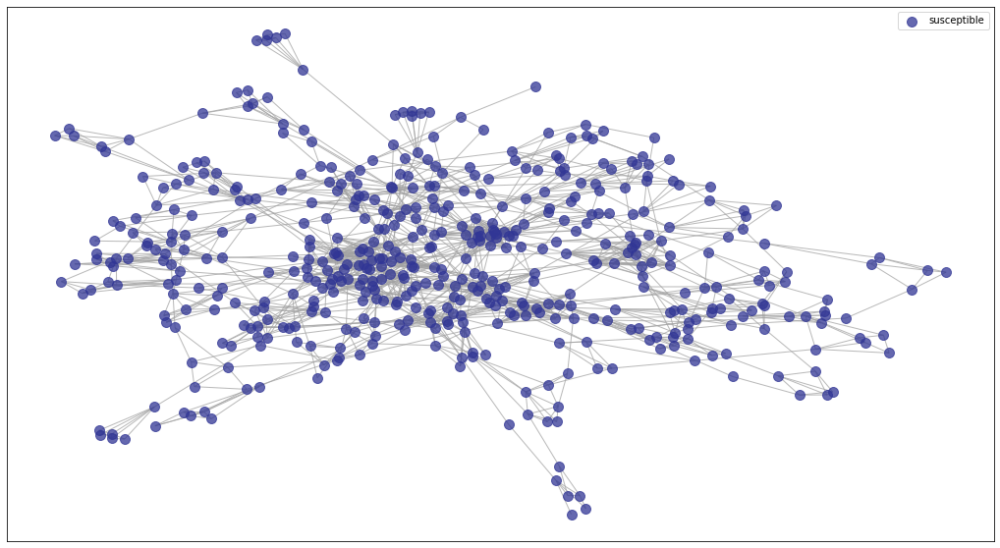

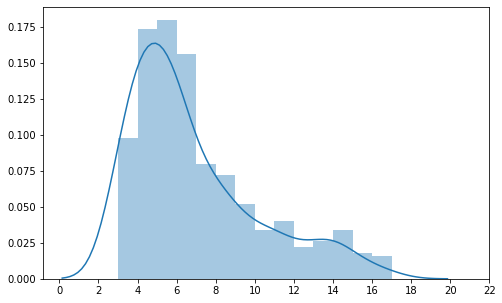

The number of connected components in the graph is 1
The diameter of the graph is 12
The average clustering coefficient of the graph is 0.4996833825118435


In [2]:
# Setting num_nodes
num_nodes = 501

# Setting a seed
rn.seed(42)

# Generating graph with num_nodes nodes
G = generate_graph(num_nodes)

# Plotting the graph
plot_graph(G)

# Plotting the node degree of the graph
plot_node_degree(G)

print("The number of connected components in the graph is {}".format(len(list(nx.connected_components(G)))))
print("The diameter of the graph is {}".format(nx.algorithms.distance_measures.diameter(G)))
print("The average clustering coefficient of the graph is {}".format(nx.algorithms.cluster.average_clustering(G)))

G_copy = deepcopy(G)

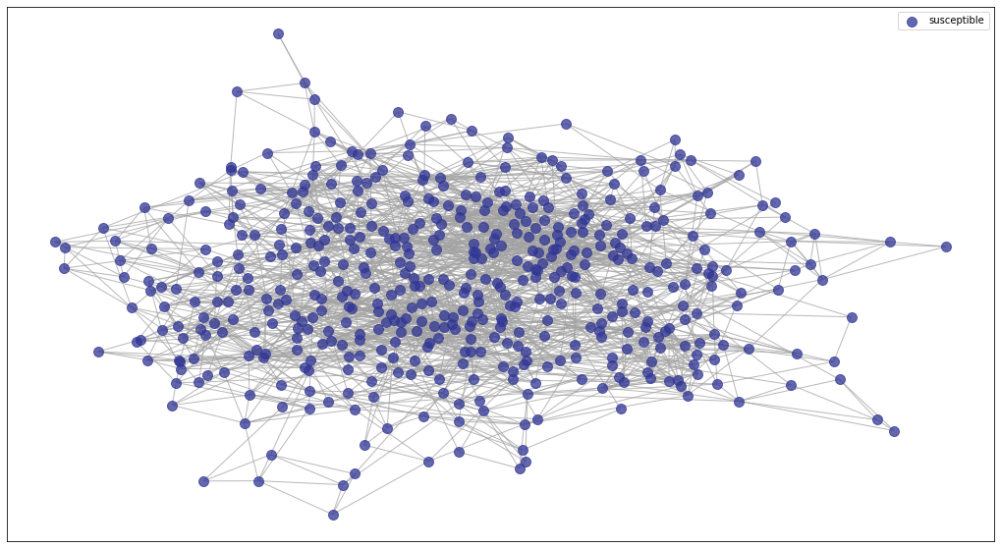

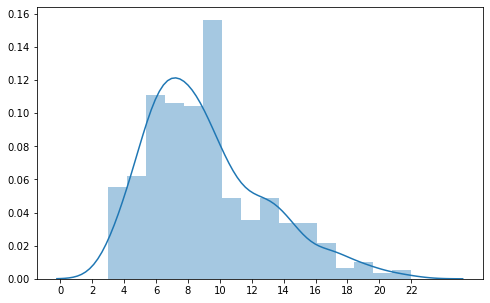

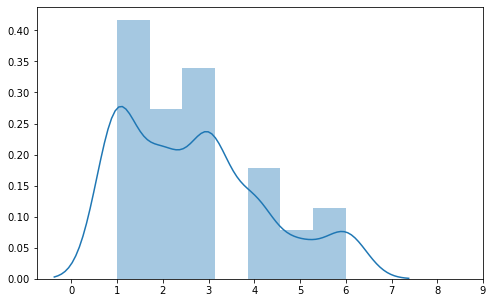

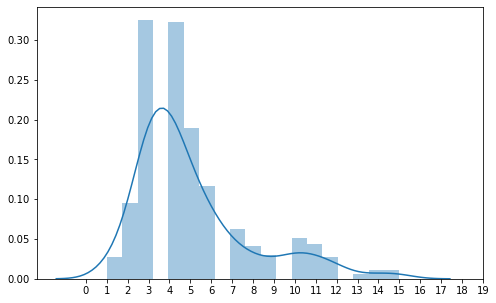

The number of connected components in the graph is 1
The diameter of the graph is 12
The average clustering coefficient of the graph is 0.4996833825118435


In [3]:
# Making a family graph
F = add_families_to_graph(deepcopy(G_copy), num_nodes)

# Plotting the new graph
plot_graph(F)

# Plotting the node degree of the graph
plot_node_degree(F)

# Plotting the familiy degree of the graph
plot_family_degree(F)

# Plotting the community degree of the graph
plot_community_degree(F)

print("The number of connected components in the graph is {}".format(len(list(nx.connected_components(G)))))
print("The diameter of the graph is {}".format(nx.algorithms.distance_measures.diameter(G)))
print("The average clustering coefficient of the graph is {}".format(nx.algorithms.cluster.average_clustering(G)))

### Now we will test the graph based simulations on the graphs G and F (without and with family) for different sets of hyperparameters in order to see the effect of each. We will also test for dynamic changes (quarantines). All tests will be done on a span of 500 days. 

In [10]:
# Testing on G (no family) with and without quarantines
set_initial_exposed = [5, 10]
set_gray_mass = [0.0001, 0.0005]
set_num_quarantines = list(np.arange(0, 7, 2))
set_quarantine_len = list(np.arange(10, 30, 10))
set_t_ei = [8, 9]  # Time to shift from exposed to infected
set_t_rs = [120, 150]  # Time to resus
set_reinfection = [0.17, 0.2]
set_comm_talk_freq = [3, 6, 9]
set_comm_talk_freq_change = [1, 2, 3]
set_other_talk_freq = [8, 10, 12]
set_other_talk_freq_change = [1, 2, 4]
set_p_er = [0.17, 0.19]  # Probability of asympt

# We will also use beta as a slider so we don't pass it here
params_list = get_param_list(False, 500, set_initial_exposed, set_num_quarantines, set_quarantine_len,
                             set_t_ei, set_t_rs, set_reinfection, set_comm_talk_freq, set_comm_talk_freq_change,
                             set_other_talk_freq, set_other_talk_freq_change, set_p_er, set_gray_mass)

# Taking only 10 simulations
total_simulation_time = time.time()
final_param_list = rn.sample(params_list, 10)
for param_list in final_param_list:
    param_list["num_quarantines"] = int(param_list["num_quarantines"])
    param_list["quarantine_len"] = int(param_list["quarantine_len"])
    dict_pretty = json.dumps(
    param_list,
    sort_keys=True,
    indent=4,
    separators=(',', ': '))
    print(f'Testing simulation for current parameter values: \n{dict_pretty}')
    print(f'Beta is variable from 1 to 4 with 0.5 increment.')
    simulation_time = time.time()
    slider_simulation(G, param_list, slide_by="beta", values=np.arange(1, 4, 0.5))
    simulation_end_time = time.time()
    print(f'Time elapsed for previous simulation: {np.round(simulation_end_time-simulation_time,2)}s.')
end_time = time.time()
print(f'Total time elapsed (of all simulations): {np.round(end_time-total_simulation_time,2)}s.')

Testing simulation for current parameter values: 
{
    "beta": 3,
    "comm_talk_freq": 3,
    "comm_talk_freq_change": 2,
    "family": false,
    "gray_mass": 0.0005,
    "initial_exposed": 5,
    "num_days": 500,
    "num_quarantines": 2,
    "other_talk_freq": 8,
    "other_talk_freq_change": 1,
    "p_er": 0.19,
    "quarantine_len": 10,
    "reinfection": 0.17,
    "t_ei": 8,
    "t_rs": 120
}
Beta is variable from 1 to 4 with 0.5 increment.


Time elapsed for previous simulation: 60.92s.
Testing simulation for current parameter values: 
{
    "beta": 3,
    "comm_talk_freq": 3,
    "comm_talk_freq_change": 2,
    "family": false,
    "gray_mass": 0.0005,
    "initial_exposed": 10,
    "num_days": 500,
    "num_quarantines": 4,
    "other_talk_freq": 8,
    "other_talk_freq_change": 1,
    "p_er": 0.17,
    "quarantine_len": 10,
    "reinfection": 0.2,
    "t_ei": 9,
    "t_rs": 150
}
Beta is variable from 1 to 4 with 0.5 increment.


Time elapsed for previous simulation: 60.89s.
Testing simulation for current parameter values: 
{
    "beta": 3,
    "comm_talk_freq": 3,
    "comm_talk_freq_change": 3,
    "family": false,
    "gray_mass": 0.0005,
    "initial_exposed": 5,
    "num_days": 500,
    "num_quarantines": 4,
    "other_talk_freq": 10,
    "other_talk_freq_change": 2,
    "p_er": 0.17,
    "quarantine_len": 20,
    "reinfection": 0.17,
    "t_ei": 9,
    "t_rs": 150
}
Beta is variable from 1 to 4 with 0.5 increment.


Time elapsed for previous simulation: 59.63s.
Testing simulation for current parameter values: 
{
    "beta": 3,
    "comm_talk_freq": 6,
    "comm_talk_freq_change": 2,
    "family": false,
    "gray_mass": 0.0005,
    "initial_exposed": 5,
    "num_days": 500,
    "num_quarantines": 2,
    "other_talk_freq": 12,
    "other_talk_freq_change": 2,
    "p_er": 0.17,
    "quarantine_len": 20,
    "reinfection": 0.17,
    "t_ei": 8,
    "t_rs": 120
}
Beta is variable from 1 to 4 with 0.5 increment.


Time elapsed for previous simulation: 61.71s.
Testing simulation for current parameter values: 
{
    "beta": 3,
    "comm_talk_freq": 9,
    "comm_talk_freq_change": 1,
    "family": false,
    "gray_mass": 0.0005,
    "initial_exposed": 10,
    "num_days": 500,
    "num_quarantines": 2,
    "other_talk_freq": 10,
    "other_talk_freq_change": 1,
    "p_er": 0.19,
    "quarantine_len": 10,
    "reinfection": 0.2,
    "t_ei": 8,
    "t_rs": 150
}
Beta is variable from 1 to 4 with 0.5 increment.


Time elapsed for previous simulation: 63.69s.
Testing simulation for current parameter values: 
{
    "beta": 3,
    "comm_talk_freq": 9,
    "comm_talk_freq_change": 2,
    "family": false,
    "gray_mass": 0.0005,
    "initial_exposed": 5,
    "num_days": 500,
    "num_quarantines": 2,
    "other_talk_freq": 10,
    "other_talk_freq_change": 4,
    "p_er": 0.17,
    "quarantine_len": 10,
    "reinfection": 0.17,
    "t_ei": 9,
    "t_rs": 150
}
Beta is variable from 1 to 4 with 0.5 increment.


Time elapsed for previous simulation: 58.87s.
Testing simulation for current parameter values: 
{
    "beta": 3,
    "comm_talk_freq": 6,
    "comm_talk_freq_change": 3,
    "family": false,
    "gray_mass": 0.0005,
    "initial_exposed": 10,
    "num_days": 500,
    "num_quarantines": 2,
    "other_talk_freq": 8,
    "other_talk_freq_change": 2,
    "p_er": 0.17,
    "quarantine_len": 10,
    "reinfection": 0.17,
    "t_ei": 9,
    "t_rs": 120
}
Beta is variable from 1 to 4 with 0.5 increment.


Time elapsed for previous simulation: 62.2s.
Testing simulation for current parameter values: 
{
    "beta": 3,
    "comm_talk_freq": 9,
    "comm_talk_freq_change": 2,
    "family": false,
    "gray_mass": 0.0005,
    "initial_exposed": 10,
    "num_days": 500,
    "num_quarantines": 4,
    "other_talk_freq": 12,
    "other_talk_freq_change": 1,
    "p_er": 0.19,
    "quarantine_len": 10,
    "reinfection": 0.17,
    "t_ei": 9,
    "t_rs": 150
}
Beta is variable from 1 to 4 with 0.5 increment.


Time elapsed for previous simulation: 60.04s.
Testing simulation for current parameter values: 
{
    "beta": 3,
    "comm_talk_freq": 9,
    "comm_talk_freq_change": 1,
    "family": false,
    "gray_mass": 0.0001,
    "initial_exposed": 10,
    "num_days": 500,
    "num_quarantines": 0,
    "other_talk_freq": 8,
    "other_talk_freq_change": 1,
    "p_er": 0.17,
    "quarantine_len": 20,
    "reinfection": 0.17,
    "t_ei": 9,
    "t_rs": 120
}
Beta is variable from 1 to 4 with 0.5 increment.


Time elapsed for previous simulation: 62.93s.
Testing simulation for current parameter values: 
{
    "beta": 3,
    "comm_talk_freq": 3,
    "comm_talk_freq_change": 2,
    "family": false,
    "gray_mass": 0.0005,
    "initial_exposed": 5,
    "num_days": 500,
    "num_quarantines": 2,
    "other_talk_freq": 8,
    "other_talk_freq_change": 1,
    "p_er": 0.17,
    "quarantine_len": 10,
    "reinfection": 0.2,
    "t_ei": 9,
    "t_rs": 150
}
Beta is variable from 1 to 4 with 0.5 increment.


Time elapsed for previous simulation: 59.49s.
Total time elapsed (of all simulations): 610.36s.


In [12]:
# Testing on F (no family) with and without quarantines
set_initial_exposed = [5, 10]
set_gray_mass = [0.0001, 0.0005]
set_num_quarantines = list(np.arange(0, 7, 2))
set_quarantine_len = list(np.arange(10, 30, 10))
set_t_ei = [8, 9]  # Time to shift from exposed to infected
set_t_rs = [120, 150]  # Time to resus
set_reinfection = [0.17, 0.2]
set_comm_talk_freq = [3, 6, 9]
set_comm_talk_freq_change = [1, 2, 3]
set_other_talk_freq = [8, 10, 12]
set_other_talk_freq_change = [1, 2, 4]
set_p_er = [0.17, 0.19]  # Probability of asympt

# We will also use beta as a slider so we don't pass it here
params_list = get_param_list(True, 500, set_initial_exposed, set_num_quarantines, set_quarantine_len,
                             set_t_ei, set_t_rs, set_reinfection, set_comm_talk_freq, set_comm_talk_freq_change,
                             set_other_talk_freq, set_other_talk_freq_change, set_p_er, set_gray_mass)

# Taking only 10 simulations
total_simulation_time = time.time()
final_param_list = rn.sample(params_list, 10)
for param_list in final_param_list:
    param_list["num_quarantines"] = int(param_list["num_quarantines"])
    param_list["quarantine_len"] = int(param_list["quarantine_len"])
    dict_pretty = json.dumps(
    param_list,
    sort_keys=True,
    indent=4,
    separators=(',', ': '))
    print(f'Testing simulation for current parameter values: \n{dict_pretty}')
    print(f'Beta is variable from 1 to 4 with 0.5 increment.')
    simulation_time = time.time()
    slider_simulation(F, param_list, slide_by="beta", values=np.arange(1, 4, 0.5))
    simulation_end_time = time.time()
    print(f'Time elapsed for previous simulation: {np.round(simulation_end_time-simulation_time,2)}s.')
end_time = time.time()
print(f'Total time elapsed (of all simulations): {np.round(end_time-total_simulation_time,2)}s.')

Testing simulation for current parameter values: 
{
    "beta": 3,
    "comm_talk_freq": 3,
    "comm_talk_freq_change": 2,
    "family": true,
    "gray_mass": 0.0001,
    "initial_exposed": 5,
    "num_days": 500,
    "num_quarantines": 2,
    "other_talk_freq": 8,
    "other_talk_freq_change": 2,
    "p_er": 0.17,
    "quarantine_len": 20,
    "reinfection": 0.17,
    "t_ei": 9,
    "t_rs": 150
}
Beta is variable from 1 to 4 with 0.5 increment.


Time elapsed for previous simulation: 63.15s.
Testing simulation for current parameter values: 
{
    "beta": 3,
    "comm_talk_freq": 9,
    "comm_talk_freq_change": 3,
    "family": true,
    "gray_mass": 0.0005,
    "initial_exposed": 10,
    "num_days": 500,
    "num_quarantines": 4,
    "other_talk_freq": 12,
    "other_talk_freq_change": 1,
    "p_er": 0.17,
    "quarantine_len": 20,
    "reinfection": 0.2,
    "t_ei": 8,
    "t_rs": 150
}
Beta is variable from 1 to 4 with 0.5 increment.


Time elapsed for previous simulation: 64.28s.
Testing simulation for current parameter values: 
{
    "beta": 3,
    "comm_talk_freq": 6,
    "comm_talk_freq_change": 3,
    "family": true,
    "gray_mass": 0.0001,
    "initial_exposed": 5,
    "num_days": 500,
    "num_quarantines": 6,
    "other_talk_freq": 12,
    "other_talk_freq_change": 1,
    "p_er": 0.19,
    "quarantine_len": 10,
    "reinfection": 0.17,
    "t_ei": 8,
    "t_rs": 120
}
Beta is variable from 1 to 4 with 0.5 increment.


Time elapsed for previous simulation: 64.99s.
Testing simulation for current parameter values: 
{
    "beta": 3,
    "comm_talk_freq": 6,
    "comm_talk_freq_change": 3,
    "family": true,
    "gray_mass": 0.0001,
    "initial_exposed": 10,
    "num_days": 500,
    "num_quarantines": 4,
    "other_talk_freq": 8,
    "other_talk_freq_change": 1,
    "p_er": 0.17,
    "quarantine_len": 20,
    "reinfection": 0.2,
    "t_ei": 8,
    "t_rs": 120
}
Beta is variable from 1 to 4 with 0.5 increment.


Time elapsed for previous simulation: 64.54s.
Testing simulation for current parameter values: 
{
    "beta": 3,
    "comm_talk_freq": 6,
    "comm_talk_freq_change": 2,
    "family": true,
    "gray_mass": 0.0001,
    "initial_exposed": 10,
    "num_days": 500,
    "num_quarantines": 6,
    "other_talk_freq": 12,
    "other_talk_freq_change": 4,
    "p_er": 0.19,
    "quarantine_len": 20,
    "reinfection": 0.17,
    "t_ei": 9,
    "t_rs": 150
}
Beta is variable from 1 to 4 with 0.5 increment.


Time elapsed for previous simulation: 63.25s.
Testing simulation for current parameter values: 
{
    "beta": 3,
    "comm_talk_freq": 9,
    "comm_talk_freq_change": 2,
    "family": true,
    "gray_mass": 0.0005,
    "initial_exposed": 10,
    "num_days": 500,
    "num_quarantines": 2,
    "other_talk_freq": 10,
    "other_talk_freq_change": 2,
    "p_er": 0.17,
    "quarantine_len": 10,
    "reinfection": 0.2,
    "t_ei": 9,
    "t_rs": 150
}
Beta is variable from 1 to 4 with 0.5 increment.


Time elapsed for previous simulation: 66.01s.
Testing simulation for current parameter values: 
{
    "beta": 3,
    "comm_talk_freq": 3,
    "comm_talk_freq_change": 2,
    "family": true,
    "gray_mass": 0.0005,
    "initial_exposed": 10,
    "num_days": 500,
    "num_quarantines": 6,
    "other_talk_freq": 8,
    "other_talk_freq_change": 1,
    "p_er": 0.19,
    "quarantine_len": 10,
    "reinfection": 0.2,
    "t_ei": 8,
    "t_rs": 120
}
Beta is variable from 1 to 4 with 0.5 increment.


Time elapsed for previous simulation: 64.15s.
Testing simulation for current parameter values: 
{
    "beta": 3,
    "comm_talk_freq": 6,
    "comm_talk_freq_change": 2,
    "family": true,
    "gray_mass": 0.0001,
    "initial_exposed": 5,
    "num_days": 500,
    "num_quarantines": 6,
    "other_talk_freq": 12,
    "other_talk_freq_change": 4,
    "p_er": 0.19,
    "quarantine_len": 20,
    "reinfection": 0.17,
    "t_ei": 9,
    "t_rs": 120
}
Beta is variable from 1 to 4 with 0.5 increment.


Time elapsed for previous simulation: 62.91s.
Testing simulation for current parameter values: 
{
    "beta": 3,
    "comm_talk_freq": 6,
    "comm_talk_freq_change": 2,
    "family": true,
    "gray_mass": 0.0005,
    "initial_exposed": 5,
    "num_days": 500,
    "num_quarantines": 2,
    "other_talk_freq": 8,
    "other_talk_freq_change": 4,
    "p_er": 0.19,
    "quarantine_len": 10,
    "reinfection": 0.17,
    "t_ei": 8,
    "t_rs": 150
}
Beta is variable from 1 to 4 with 0.5 increment.


Time elapsed for previous simulation: 64.38s.
Testing simulation for current parameter values: 
{
    "beta": 3,
    "comm_talk_freq": 3,
    "comm_talk_freq_change": 3,
    "family": true,
    "gray_mass": 0.0005,
    "initial_exposed": 5,
    "num_days": 500,
    "num_quarantines": 0,
    "other_talk_freq": 10,
    "other_talk_freq_change": 1,
    "p_er": 0.19,
    "quarantine_len": 10,
    "reinfection": 0.17,
    "t_ei": 8,
    "t_rs": 150
}
Beta is variable from 1 to 4 with 0.5 increment.


Time elapsed for previous simulation: 64.05s.
Total time elapsed (of all simulations): 641.72s.
